In [1]:
!pip install -U -q gdown ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 862.6/862.6 kB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 53.8 MB/s eta 0:00:00


In [2]:
import os
import shutil
import gdown
import random
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from collections import Counter
from xml.etree import ElementTree
import cv2
import matplotlib.pyplot as plt
from IPython.display import Image, Video
from ultralytics import YOLO

In [3]:
raw_data_path = 'raw_data'

In [4]:
if os.path.exists(raw_data_path):
    print('[INFO] Raw data directory exists, skiping download.')
else:
    os.makedirs(raw_data_path)
    print('[INFO] Raw data directory is been created.')
    print('[INFO] Downloading data...\n')
    gdown.download('https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw', output=os.path.join(raw_data_path, 'Annotations.zip'))
    gdown.download('https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr', output=os.path.join(raw_data_path, 'JPEGImages-test.zip'))
    gdown.download('https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir', output=os.path.join(raw_data_path, 'JPEGImages-trainval.zip'))
    print('[INFO] Data is been downloaded.')

[INFO] Raw data directory is been created.
[INFO] Downloading data...



Downloading...
From (original): https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw
From (redirected): https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw&confirm=t&uuid=b398f08c-87c7-466c-be90-947ce4b30a6c
To: /content/raw_data/Annotations.zip
100%|██████████| 32.1M/32.1M [00:01<00:00, 20.5MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr
From (redirected): https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr&confirm=t&uuid=b8c9b820-e1c9-4809-bc83-0d24024379ab
To: /content/raw_data/JPEGImages-test.zip
100%|██████████| 3.52G/3.52G [00:56<00:00, 62.5MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir
From (redirected): https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir&confirm=t&uuid=2331087e-7da0-491e-a707-f9de9748b9f0
To: /content/raw_data/JPEGImages-trainval.zip
100%|██████████| 3.88G/3.88G [01:29<00:00, 43.2MB/s]

[INFO] Data is been downloaded.


In [5]:
dior_data_path = 'dior_data'

In [6]:
if os.path.exists(dior_data_path):
    print('[INFO] DIOR data directory exists, skiping extraction.')
else:
    os.makedirs(dior_data_path)
    for i in os.listdir(raw_data_path):
        filename = os.path.join(raw_data_path, i)
        shutil.unpack_archive(filename=filename, extract_dir=dior_data_path)
        print(f'[INFO] File "{filename}" is been extracted to "{dior_data_path}".')

[INFO] File "raw_data/JPEGImages-test.zip" is been extracted to "dior_data".
[INFO] File "raw_data/JPEGImages-trainval.zip" is been extracted to "dior_data".
[INFO] File "raw_data/Annotations.zip" is been extracted to "dior_data".


In [7]:
annot_data_path = 'dior_data/Annotations/Horizontal Bounding Boxes'
trainval_data_path = 'dior_data/JPEGImages-trainval'
test_data_path = 'dior_data/JPEGImages-test'

In [8]:
annot_file_list = sorted([os.path.join(annot_data_path, i) for i in os.listdir(annot_data_path) if '.xml' in i])
annot_file_list[:5], annot_file_list[-5:], len(annot_file_list)

(['dior_data/Annotations/Horizontal Bounding Boxes/00001.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00002.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00003.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00004.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00005.xml'],
 ['dior_data/Annotations/Horizontal Bounding Boxes/23459.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23460.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23461.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23462.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23463.xml'],
 23463)

In [9]:
trainval_file_list = sorted([os.path.join(trainval_data_path, i) for i in os.listdir(trainval_data_path) if '.jpg' in i])
trainval_file_list[:5], trainval_file_list[-5:], len(trainval_file_list)

(['dior_data/JPEGImages-trainval/00001.jpg',
  'dior_data/JPEGImages-trainval/00002.jpg',
  'dior_data/JPEGImages-trainval/00003.jpg',
  'dior_data/JPEGImages-trainval/00004.jpg',
  'dior_data/JPEGImages-trainval/00005.jpg'],
 ['dior_data/JPEGImages-trainval/11721.jpg',
  'dior_data/JPEGImages-trainval/11722.jpg',
  'dior_data/JPEGImages-trainval/11723.jpg',
  'dior_data/JPEGImages-trainval/11724.jpg',
  'dior_data/JPEGImages-trainval/11725.jpg'],
 11725)

In [10]:
test_file_list = sorted([os.path.join(test_data_path, i) for i in os.listdir(test_data_path) if '.jpg' in i])
test_file_list[:5], test_file_list[-5:], len(test_file_list)

(['dior_data/JPEGImages-test/11726.jpg',
  'dior_data/JPEGImages-test/11727.jpg',
  'dior_data/JPEGImages-test/11728.jpg',
  'dior_data/JPEGImages-test/11729.jpg',
  'dior_data/JPEGImages-test/11730.jpg'],
 ['dior_data/JPEGImages-test/23459.jpg',
  'dior_data/JPEGImages-test/23460.jpg',
  'dior_data/JPEGImages-test/23461.jpg',
  'dior_data/JPEGImages-test/23462.jpg',
  'dior_data/JPEGImages-test/23463.jpg'],
 11738)

In [11]:
image_data_file_list = np.concatenate((trainval_file_list, test_file_list))
image_data_file_list[:5], image_data_file_list[-5:], len(image_data_file_list)

(array(['dior_data/JPEGImages-trainval/00001.jpg', 'dior_data/JPEGImages-trainval/00002.jpg', 'dior_data/JPEGImages-trainval/00003.jpg', 'dior_data/JPEGImages-trainval/00004.jpg', 'dior_data/JPEGImages-trainval/00005.jpg'], dtype='<U39'),
 array(['dior_data/JPEGImages-test/23459.jpg', 'dior_data/JPEGImages-test/23460.jpg', 'dior_data/JPEGImages-test/23461.jpg', 'dior_data/JPEGImages-test/23462.jpg', 'dior_data/JPEGImages-test/23463.jpg'], dtype='<U39'),
 23463)

In [12]:
meta_list = []
object_list_train = []
object_list_test = []
for file in tqdm(annot_file_list):
    meta_dict = {}
    root = ElementTree.parse(file).getroot()
    for path in image_data_file_list:
        if root.find('filename').text in path:
            meta_dict['filename'] = path
            meta_dict['split_type'] = path.split('/')[1]
    meta_dict['width'] = int(root.find('size').find('width').text)
    meta_dict['height'] = int(root.find('size').find('height').text)
    meta_dict['objects'] = ', '.join(np.unique([obj.find('name').text for obj in root.findall('object')]))
    meta_list.append(meta_dict)
    for obj in root.findall('object'):
        if meta_dict['split_type'] == 'JPEGImages-trainval':
            object_list_train.append(obj.find('name').text)
        elif meta_dict['split_type'] == 'JPEGImages-test':
            object_list_test.append(obj.find('name').text)
object_instance_list_train = Counter(sorted(object_list_train))
object_instance_list_test = Counter(sorted(object_list_test))
class_dict = {k: v for v, k in enumerate(sorted(np.unique(object_list_train)))}
meta_list[:5], object_instance_list_train, object_instance_list_test, class_dict

  0%|          | 0/23463 [00:00<?, ?it/s]

([{'filename': 'dior_data/JPEGImages-trainval/00001.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'golffield'},
  {'filename': 'dior_data/JPEGImages-trainval/00002.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'Expressway-toll-station, vehicle'},
  {'filename': 'dior_data/JPEGImages-trainval/00003.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'trainstation'},
  {'filename': 'dior_data/JPEGImages-trainval/00004.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'chimney'},
  {'filename': 'dior_data/JPEGImages-trainval/00005.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'storagetank, vehicle'}],
 Counter({'Expressway-Service-area': 1080,
          'Expressway-toll-station': 610,
          'airplane': 1888,
          'airport': 662,
          'baseballf

In [13]:
meta_df = pd.DataFrame(meta_list)
meta_df

,filename,split_type,width,height,objects
0,dior_data/JPEGImages-trainval/00001.jpg,JPEGImages-trainval,800,800,golffield
1,dior_data/JPEGImages-trainval/00002.jpg,JPEGImages-trainval,800,800,"Expressway-toll-station, vehicle"
2,dior_data/JPEGImages-trainval/00003.jpg,JPEGImages-trainval,800,800,trainstation
3,dior_data/JPEGImages-trainval/00004.jpg,JPEGImages-trainval,800,800,chimney
4,dior_data/JPEGImages-trainval/00005.jpg,JPEGImages-trainval,800,800,"storagetank, vehicle"
...,...,...,...,...,...
23458,dior_data/JPEGImages-test/23459.jpg,JPEGImages-test,800,800,vehicle
23459,dior_data/JPEGImages-test/23460.jpg,JPEGImages-test,800,800,"groundtrackfield, tenniscourt, vehicle"
23460,dior_data/JPEGImages-test/23461.jpg,JPEGImages-test,800,800,"overpass, vehicle"
23461,dior_data/JPEGImages-test/23462.jpg,JPEGImages-test,800,800,"overpass, vehicle"


In [14]:
print(f'Size of the images width: {meta_df.width.unique()[0]} and height: {meta_df.height.unique()[0]}')
print(f'Total number of classes with all possible combination: {len(meta_df.objects.unique())}')
print(f'Total length of the training/validation dataset: {len(meta_df[meta_df["split_type"] == "JPEGImages-trainval"])} and testing dataset: {len(meta_df[meta_df["split_type"] == "JPEGImages-test"])}')

Size of the images width: 800 and height: 800
Total number of classes with all possible combination: 526
Total length of the training/validation dataset: 11725 and testing dataset: 11738


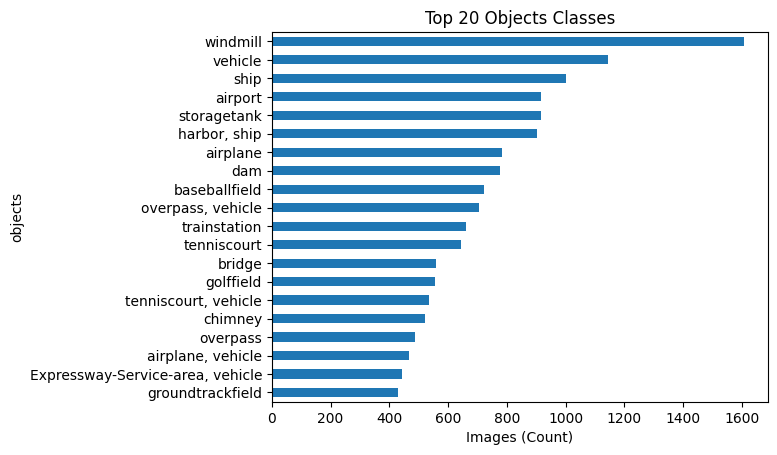

In [15]:
meta_df.objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Top 20 Objects Classes');

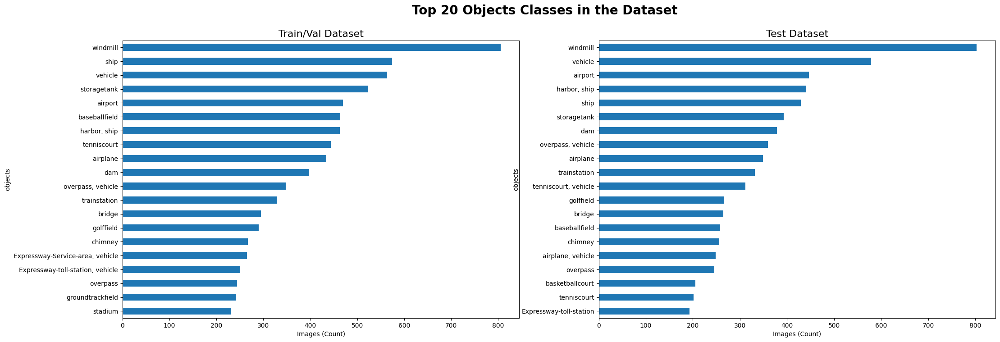

In [16]:
plt.figure(figsize=(25, 8))
plt.subplot(1, 2, 1)
meta_df[meta_df["split_type"] == "JPEGImages-trainval"].objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Train/Val Dataset', fontsize=16)
plt.subplot(1, 2, 2)
meta_df[meta_df["split_type"] == "JPEGImages-test"].objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Test Dataset', fontsize=16)
plt.suptitle('Top 20 Objects Classes in the Dataset', fontsize=20, fontweight='bold');

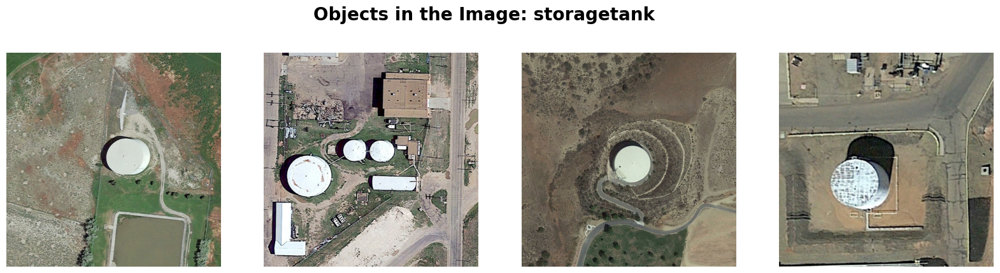

In [17]:
viz_class = random.sample(meta_df.objects.tolist(), 1)[0]
viz_list = meta_df[meta_df['objects'] == viz_class].filename.tolist()
plt.figure(figsize=(20, 5))
rand = random.sample(viz_list, 4)
for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.imshow(plt.imread(rand[i]))
    plt.suptitle(f'Objects in the Image: {viz_class}', fontsize=20, fontweight='bold')
    plt.axis(False)

In [18]:
def extract_data_from_xml(xml_file: str):
    """
    A function to extract data like filename, size, classes and bboxes from xml file.

    Parameters: xml_file: str, A string containing the path to the file.

    Returns: data_dict: dict, A dict containing all the extracted data.
    """
    root = ElementTree.parse(xml_file).getroot()
    data_dict = {}
    data_dict['bboxes'] = []
    for element in root:
        if element.tag == 'filename':
            data_dict['filename'] = element.text
        elif element.tag == 'size':
            image_size = []
            for size_element in element:
                image_size.append(int(size_element.text))
            data_dict['image_size'] = image_size
        elif element.tag == 'object':
            bbox = {}
            for obj_element in element:
                if obj_element.tag == 'name':
                    bbox['class'] = obj_element.text
                elif obj_element.tag == 'bndbox':
                    for bbox_element in obj_element:
                        bbox[bbox_element.tag] = int(bbox_element.text)
            data_dict['bboxes'].append(bbox)
    return data_dict

In [19]:
verfiy_annotate = extract_data_from_xml(annot_file_list[1])
verfiy_annotate

{'bboxes': [{'class': 'Expressway-toll-station',
   'xmin': 231,
   'ymin': 221,
   'xmax': 303,
   'ymax': 304},
  {'class': 'vehicle', 'xmin': 49, 'ymin': 231, 'xmax': 67, 'ymax': 242},
  {'class': 'vehicle', 'xmin': 54, 'ymin': 252, 'xmax': 72, 'ymax': 262},
  {'class': 'vehicle', 'xmin': 297, 'ymin': 227, 'xmax': 316, 'ymax': 239}],
 'filename': '00002.jpg',
 'image_size': [800, 800, 3]}

In [20]:
def convert_dict_to_yolo(data_dict: dict):
    """
    A function to convert the extracted data dict into a text file as per the YOLO format.
    The final text file is saved in the directory "dior_data/yolo_annotations/data_dict['filename'].txt".

    Parameters: data_dict: dict, A dict containing the data.
    """
    data = []
    for bbox in data_dict['bboxes']:
        try:
            class_id = class_dict[bbox['class']]
        except KeyError:
            print(f'Invalid Class. Object class: "{bbox["class"]}" not present in the class list.')
        img_w, img_h, _ = data_dict['image_size']

        x_center = ((bbox['xmin'] + bbox['xmax']) / 2) / img_w
        y_center = ((bbox['ymin'] + bbox['ymax']) / 2) / img_h
        width = (bbox['xmax'] - bbox['xmin']) / img_w
        height = (bbox['ymax'] - bbox['ymin']) / img_h
        data.append(f'{class_id} {x_center:.3f} {y_center:.3f} {width:.3f} {height:.3f}')
    yolo_annot_dir = os.path.join('dior_data', 'yolo_annotations')
    if not os.path.exists(yolo_annot_dir):
        os.makedirs(yolo_annot_dir)
    save_file_name = os.path.join(yolo_annot_dir, data_dict['filename'].replace('jpg', 'txt'))
    f = open(save_file_name, 'w+')
    f.write('\n'.join(data))
    f.close()

In [21]:
print('[INFO] Annotation extraction and creation into Yolo has started.')
for annot_file in tqdm(annot_file_list):
    data_dict = extract_data_from_xml(annot_file)
    convert_dict_to_yolo(data_dict)
print('[INFO] All the annotation are converted into Yolo format.')

[INFO] Annotation extraction and creation into Yolo has started.


  0%|          | 0/23463 [00:00<?, ?it/s]

[INFO] All the annotation are converted into Yolo format.


In [22]:
yolo_annot_path = 'dior_data/yolo_annotations'
yolo_annot_file_list = sorted([os.path.join(yolo_annot_path, i) for i in os.listdir(yolo_annot_path) if '.txt' in i])
yolo_annot_file_list[:5], yolo_annot_file_list[-5:], len(yolo_annot_file_list)

(['dior_data/yolo_annotations/00001.txt',
  'dior_data/yolo_annotations/00002.txt',
  'dior_data/yolo_annotations/00003.txt',
  'dior_data/yolo_annotations/00004.txt',
  'dior_data/yolo_annotations/00005.txt'],
 ['dior_data/yolo_annotations/23459.txt',
  'dior_data/yolo_annotations/23460.txt',
  'dior_data/yolo_annotations/23461.txt',
  'dior_data/yolo_annotations/23462.txt',
  'dior_data/yolo_annotations/23463.txt'],
 23463)

In [23]:
class_dict_idx = dict(zip(class_dict.values(), class_dict.keys()))
class_dict_idx

{0: 'Expressway-Service-area',
 1: 'Expressway-toll-station',
 2: 'airplane',
 3: 'airport',
 4: 'baseballfield',
 5: 'basketballcourt',
 6: 'bridge',
 7: 'chimney',
 8: 'dam',
 9: 'golffield',
 10: 'groundtrackfield',
 11: 'harbor',
 12: 'overpass',
 13: 'ship',
 14: 'stadium',
 15: 'storagetank',
 16: 'tenniscourt',
 17: 'trainstation',
 18: 'vehicle',
 19: 'windmill'}

In [24]:
def plot_bboxes(img_file: str, annot_file: str, class_dict: dict):
    """
    A function to plot the bounding boxes amd their object classes onto the image.

    Parameters:
        img_file: str, A string containing the path to the image file.
        annot_file: str, A string containing the path to the annotation file in yolo format.
        class_dict: dict, A dict containing the classes in the similar sequence as per the annot_file.
    """
    image = cv2.imread(img_file)
    img_h, img_w, _ = image.shape
    with open(annot_file, 'r') as f:
        data = f.read().split('\n')
        data = [i.split(' ') for i in data]
        data = [[float(j) for j in i] for i in data]
    for bbox in data:
        class_idx, x_center, y_center, width, height = bbox
        xmin = int((x_center - width / 2) * img_w)
        ymin = int((y_center - height / 2) * img_h)
        xmax = int((x_center + width / 2) * img_w)
        ymax = int((y_center + height / 2) * img_h)
        if xmin < 0:
            xmin = 0
        if ymin < 0:
            ymin = 0
        if xmax > img_w - 1:
            xmax = img_w - 1
        if ymax > img_h - 1:
            ymax = img_h - 1
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 255, 0), 2)
        cv2.putText(image, class_dict[class_idx], (xmin, 0 if ymin-10 < 0 else ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 0), 2)
    plt.imshow(image)
    plt.axis(False)

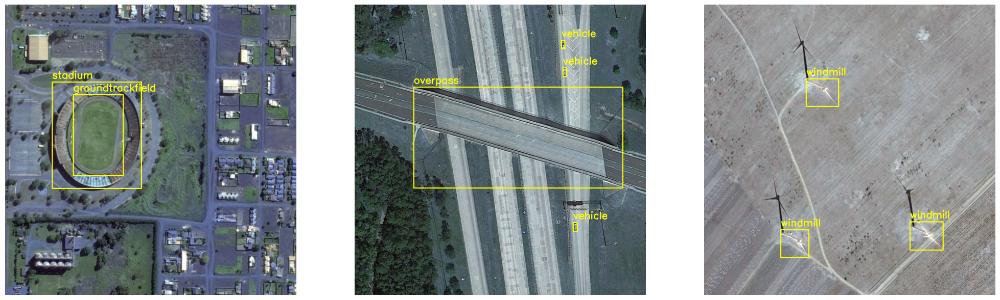

In [25]:
plt.figure(figsize=(25, 8))
rand_int = random.sample(range(len(yolo_annot_file_list)), 3)
for i in range(3):
    plt.subplot(1, 3, i+1)
    plot_bboxes(image_data_file_list[rand_int[i]], yolo_annot_file_list[rand_int[i]], class_dict_idx)

In [26]:
root_dir = 'datasets'
image_dir = 'datasets/images'
label_dir = 'datasets/labels'
img_train_dir = 'datasets/images/train'
img_val_dir = 'datasets/images/val'
label_train_dir = 'datasets/labels/train'
label_val_dir = 'datasets/labels/val'
total_val_size = int(len(test_file_list) * 0.2)
total_val_size

2347

In [27]:
if not os.path.exists(img_train_dir):
    os.makedirs(img_train_dir)
for filepath in tqdm(trainval_file_list):
    if os.path.isfile(filepath):
        shutil.move(filepath, img_train_dir)

  0%|          | 0/11725 [00:00<?, ?it/s]

In [28]:
if not os.path.exists(img_val_dir):
    os.makedirs(img_val_dir)
for filepath in tqdm(test_file_list[:total_val_size]):
    if os.path.isfile(filepath):
        shutil.move(filepath, img_val_dir)

  0%|          | 0/2347 [00:00<?, ?it/s]

In [29]:
if not os.path.exists(label_train_dir):
    os.makedirs(label_train_dir)
for filepath in tqdm(trainval_file_list):
    file_path = os.path.join('dior_data/yolo_annotations', filepath.replace('jpg', 'txt').split('/')[-1])
    if os.path.isfile(file_path):
        shutil.move(file_path, label_train_dir)

  0%|          | 0/11725 [00:00<?, ?it/s]

In [30]:
if not os.path.exists(label_val_dir):
    os.makedirs(label_val_dir)

for filepath in tqdm(test_file_list[:total_val_size]):
    file_path = os.path.join('dior_data/yolo_annotations', filepath.replace('jpg', 'txt').split('/')[-1])
    if os.path.isfile(file_path):
        shutil.move(file_path, label_val_dir)

  0%|          | 0/2347 [00:00<?, ?it/s]

In [31]:
model = YOLO('yolov8n.yaml')

In [32]:
%%writefile config.yaml
path:
train: 'images/train'
val: 'images/val'
names:
  0: Expressway-Service-area
  1: Expressway-toll-station
  2: airplane
  3: airport
  4: baseballfield
  5: basketballcourt
  6: bridge
  7: chimney
  8: dam
  9: golffield
  10: groundtrackfield
  11: harbor
  12: overpass
  13: ship
  14: stadium
  15: storagetank
  16: tenniscourt
  17: trainstation
  18: vehicle
  19: windmill

Writing config.yaml


In [34]:
results = model.train(data='config.yaml', imgsz=800, epochs=1, batch=16, name='yolov8n_epochs50_batch162')

Ultralytics YOLOv8.2.70 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=config.yaml, epochs=1, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_epochs50_batch162, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True,

train: Scanning /content/datasets/labels/train.cache... 11725 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11725/11725 [00:00<?, ?it/s]

train: WARNING ⚠️ /content/datasets/images/train/00594.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/datasets/labels/val.cache... 2347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2347/2347 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8n_epochs50_batch162/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000417, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 800 train, 800 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8n_epochs50_batch162
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1      14.9G      3.383      5.075      3.899         72        800: 100%|██████████| 733/733 [07:17<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:59<00:00,  1.25it/s]


                   all       2347      25815      0.542     0.0322     0.0139    0.00535

1 epochs completed in 0.142 hours.
Optimizer stripped from runs/detect/yolov8n_epochs50_batch162/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/yolov8n_epochs50_batch162/weights/best.pt, 6.3MB

Validating runs/detect/yolov8n_epochs50_batch162/weights/best.pt...
Ultralytics YOLOv8.2.70 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3,009,548 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:58<00:00,  1.26it/s]


                   all       2347      25815      0.542     0.0322     0.0139    0.00535
Expressway-Service-area        118        225          1          0    0.00403    0.00116
Expressway-toll-station        118        127          0          0    0.00965    0.00346
              airplane        139       1789      0.041    0.00168     0.0118    0.00391
               airport        127        128          1          0     0.0026    0.00026
         baseballfield        281        735      0.155      0.248      0.109     0.0504
       basketballcourt        146        469          1          0          0          0
                bridge        265        528          1          0    0.00184    0.00037
               chimney         88        193          1          0    0.00169   0.000807
                   dam         95        103          1          0          0          0
             golffield         95        110          1          0    0.00817    0.00188
      groundtrackfi

In [35]:
img_test_dir = 'datasets/images/test'

if not os.path.exists(img_test_dir):
    os.makedirs(img_test_dir)
test_list = os.listdir('dior_data/JPEGImages-test')
for filename in tqdm(test_list):
    filepath = os.path.join('dior_data/JPEGImages-test', filename)
    if os.path.isfile(filepath):
        shutil.move(filepath, img_test_dir)

  0%|          | 0/9391 [00:00<?, ?it/s]

In [36]:
label_test_dir = 'datasets/labels/test'
if not os.path.exists(label_test_dir):
    os.makedirs(label_test_dir)
for filename in tqdm(test_list):
    filepath = os.path.join('dior_data/yolo_annotations', filename).replace('jpg', 'txt')
    if os.path.isfile(filepath):
        shutil.move(filepath, label_test_dir)

  0%|          | 0/9391 [00:00<?, ?it/s]

In [37]:
%%writefile test_config.yaml
path:
train:
val: 'images/test'
names:
  0: Expressway-Service-area
  1: Expressway-toll-station
  2: airplane
  3: airport
  4: baseballfield
  5: basketballcourt
  6: bridge
  7: chimney
  8: dam
  9: golffield
  10: groundtrackfield
  11: harbor
  12: overpass
  13: ship
  14: stadium
  15: storagetank
  16: tenniscourt
  17: trainstation
  18: vehicle
  19: windmill

Writing test_config.yaml


In [38]:
model = YOLO('/content/runs/detect/yolov8n_epochs50_batch162/weights/best.pt')

In [39]:
test_results = model.val(data='test_config.yaml', imgsz=800, name='yolov8n_val_on_test')

Ultralytics YOLOv8.2.70 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3,009,548 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/datasets/labels/test... 9391 images, 0 backgrounds, 0 corrupt: 100%|██████████| 9391/9391 [00:27<00:00, 344.81it/s]


val: New cache created: /content/datasets/labels/test.cache


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 587/587 [03:14<00:00,  3.02it/s]


                   all       9391      98630      0.543     0.0307     0.0136    0.00534
Expressway-Service-area        447        860          1          0    0.00369    0.00111
Expressway-toll-station        516        561     0.0651    0.00178     0.0151    0.00502
              airplane        566       6423     0.0674    0.00187     0.0102     0.0033
               airport        530        538          1          0    0.00238   0.000529
         baseballfield       1030       2699      0.131      0.244      0.116     0.0572
       basketballcourt        559       1677          1          0    0.00107   0.000107
                bridge       1034       2061          1          0   0.000984   0.000253
               chimney        359        838          1          0    0.00373    0.00127
                   dam        408        435          1          0    0.00426   0.000638
             golffield        396        465          1          0    0.00825    0.00202
      groundtrackfi

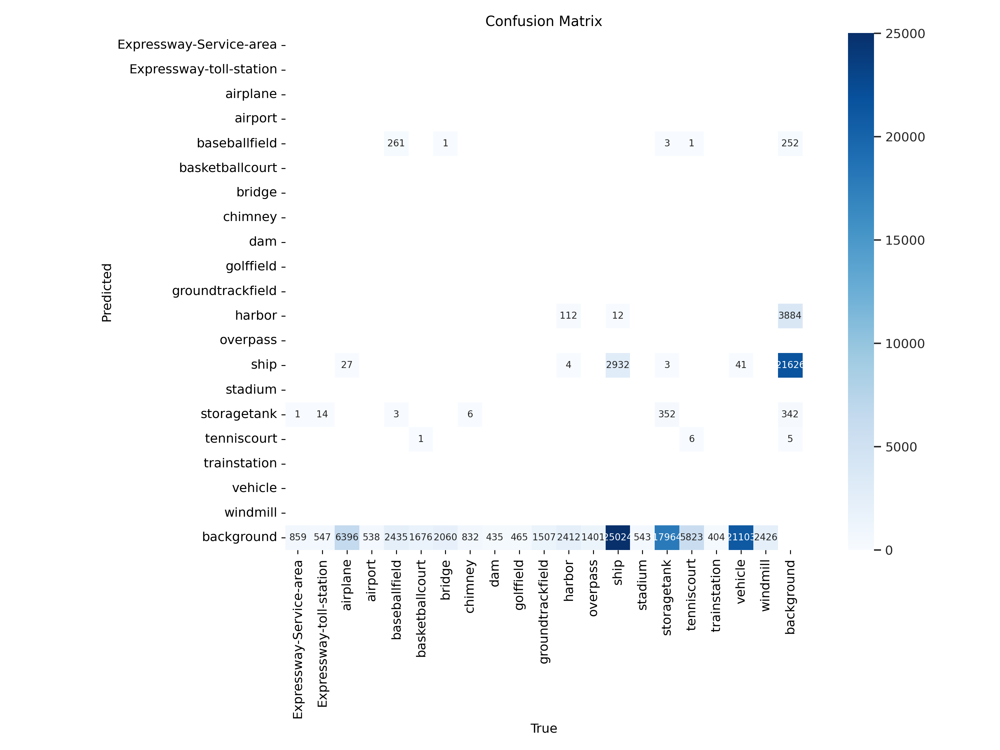

In [40]:
Image('runs/detect/yolov8n_val_on_test/confusion_matrix.png')

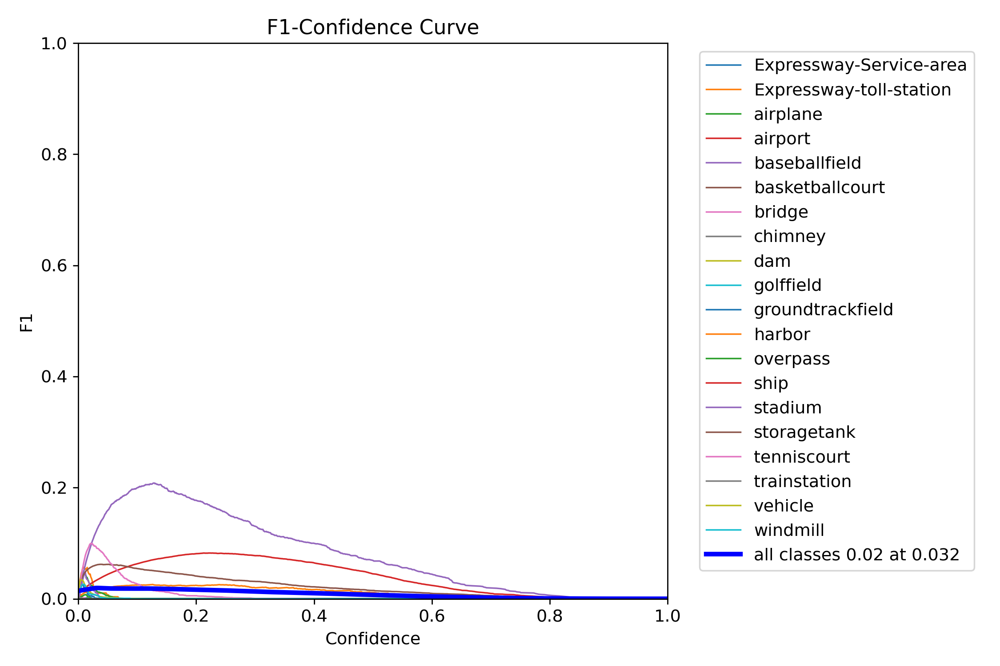

In [41]:
Image('runs/detect/yolov8n_val_on_test/F1_curve.png')

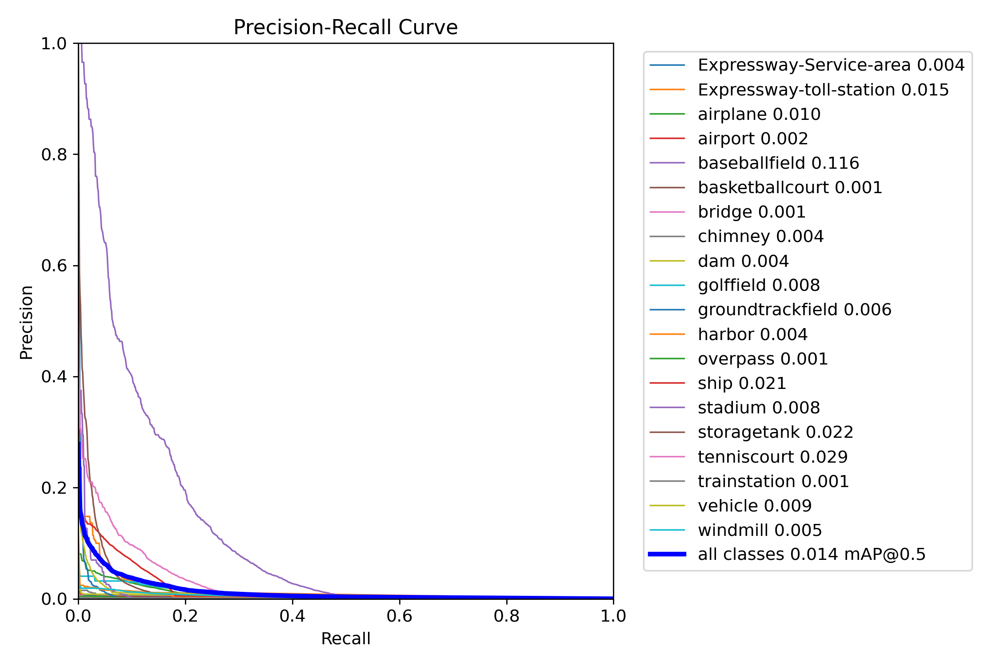

In [42]:
Image('runs/detect/yolov8n_val_on_test/PR_curve.png')

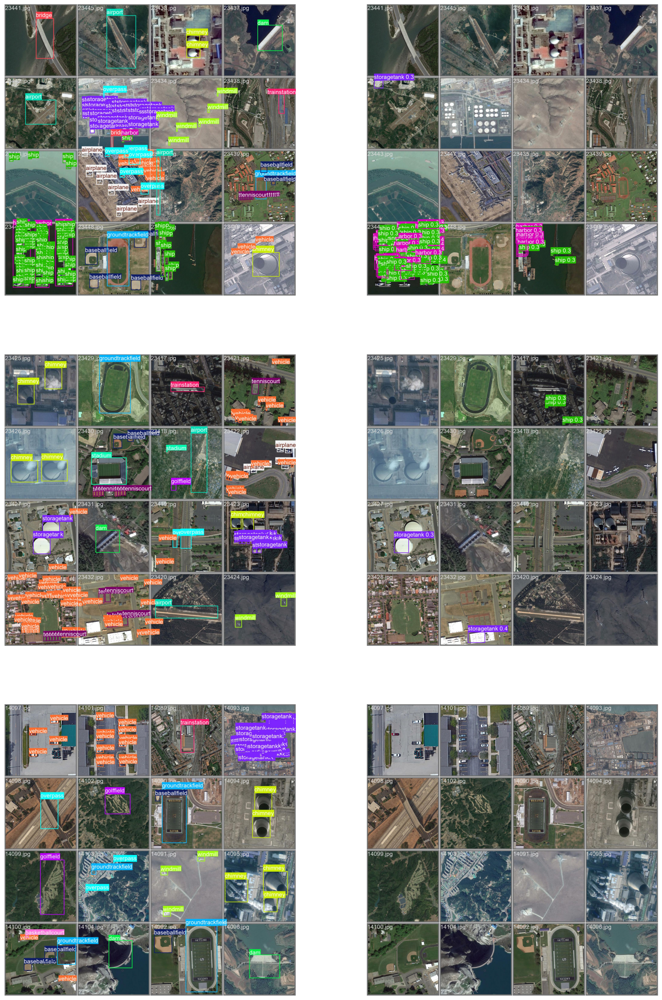

In [43]:
val_result_image = ['runs/detect/yolov8n_val_on_test/val_batch0_labels.jpg', 'runs/detect/yolov8n_val_on_test/val_batch0_pred.jpg', 'runs/detect/yolov8n_val_on_test/val_batch1_labels.jpg', 'runs/detect/yolov8n_val_on_test/val_batch1_pred.jpg', 'runs/detect/yolov8n_val_on_test/val_batch2_labels.jpg', 'runs/detect/yolov8n_val_on_test/val_batch2_pred.jpg']
plt.figure(figsize=(20, 30))
for i in range(len(val_result_image)):
    plt.subplot(3, 2, i+1)
    plt.imshow(plt.imread(val_result_image[i]))
    plt.axis(False)

In [44]:
model = YOLO('runs/detect/yolov8n_epochs50_batch162/weights/best.pt')


image 1/1 /content/datasets/images/test/21355.jpg: 800x800 (no detections), 66.9ms
Speed: 18.3ms preprocess, 66.9ms inference, 1.1ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict


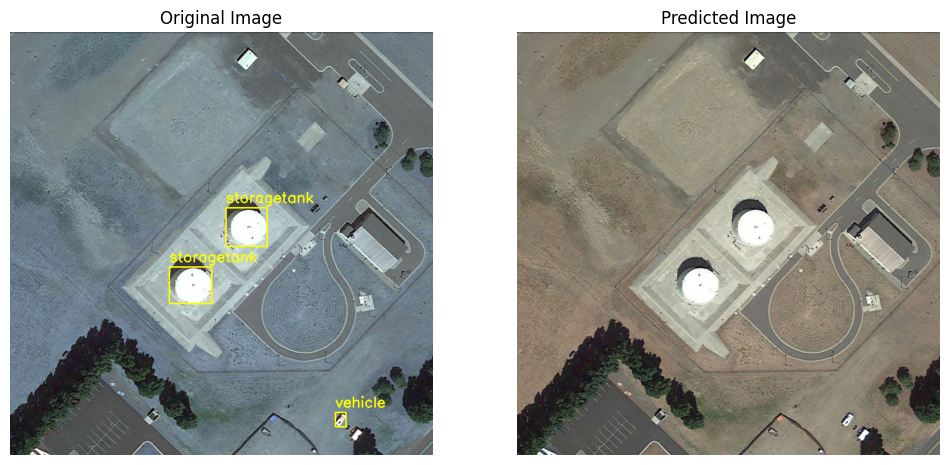

In [46]:
img_test_dir = 'datasets/images/test'
label_test_dir = 'datasets/labels/test'
rand_img = random.sample(os.listdir(img_test_dir), 1)[0]
rand_img_path = os.path.join(img_test_dir, rand_img)
rand_label_path = os.path.join(label_test_dir, rand_img).replace('jpg', 'txt')
pred_list = model.predict(source=rand_img_path, imgsz=800, save=True, conf=0.5)
pred_img_path = os.path.join('/content/runs/detect/predict', rand_img)
plt.figure(figsize=(12, 7))
plt.subplot(1, 2, 1)
plot_bboxes(rand_img_path, rand_label_path, class_dict_idx)
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(plt.imread(pred_img_path))
plt.title('Predicted Image')
plt.axis(False);